In [1]:
import pandas as pd

filename = "movie_review.xlsx"

file_path = f"data datmin ii/{filename}"

df = pd.read_excel(file_path)

display(df)

,fold_id,cv_tag,html_id,sent_id,text,tag
0,0,cv000,29416,0,"plot : two teen couples go to a church party ,...",neg
1,0,cv000,29416,1,they get into an accident .,neg
2,0,cv000,29416,2,"one of the guys dies , but his girlfriend cont...",neg
3,0,cv000,29416,3,what's the deal ?,neg
4,0,cv000,29416,4,"watch the movie and "" sorta "" find out . . .",neg
...,...,...,...,...,...,...
63118,9,cv999,13106,55,there's also no point in the movie where the p...,pos
63119,9,cv999,13106,56,"it's a quick , straight shot to the movie's end .",pos
63120,9,cv999,13106,57,"in terms of overall quality , i would compare ...",pos
63121,9,cv999,13106,58,both films are well made with interesting stor...,pos


In [2]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import PorterStemmer
from textblob import TextBlob
import re

In [3]:
import re

def clean_text(text):
    text = str(text).lower()  # Pastikan teks menjadi string dan kecilkan hurufnya
    
    text = re.sub(r'http\S+|www\S+|https\S+', '', text, flags=re.MULTILINE)
    text = re.sub(r'@\w+', '', text)
    text = re.sub(r'#\w+', '', text)
    text = re.sub(r'\d+', '', text)
    text = re.sub(r'[^\w\s]', '', text)
    text = re.sub(r'\s+', ' ', text).strip()
    
    return text


list_bersih = []

for index, row in df.iterrows():
    cleaned_text = clean_text(row['text'])
    list_bersih.append(cleaned_text)

list_bersih


['plot two teen couples go to a church party drink and then drive',
 'they get into an accident',
 'one of the guys dies but his girlfriend continues to see him in her life and has nightmares',
 'whats the deal',
 'watch the movie and sorta find out',
 'critique a mindfuck movie for the teen generation that touches on a very cool idea but presents it in a very bad package',
 'which is what makes this review an even harder one to write since i generally applaud films which attempt to break the mold mess with your head and such lost highway memento but there are good and bad ways of making all types of films and these folks just didnt snag this one correctly',
 'they seem to have taken this pretty neat concept but executed it terribly',
 'so what are the problems with the movie',
 'well its main problem is that its simply too jumbled',
 'it starts off normal but then downshifts into this fantasy world in which you as an audience member have no idea whats going on',
 'there are dreams the

In [4]:
stop_words = set(stopwords.words('english'))

list_bersih_stop = []

for i in range(len(list_bersih)):
    teks = list_bersih[i]
    # Hapus stopwords dari teks yang telah dibersihkan
    teks_bersih_stop = ' '.join([word for word in teks.split() if word.lower() not in stop_words])
    list_bersih_stop.append(teks_bersih_stop)
    print("Teks ke", i, "sudah dibersihkan dan stop words dihapus")


Teks ke 0 sudah dibersihkan dan stop words dihapus
Teks ke 1 sudah dibersihkan dan stop words dihapus
Teks ke 2 sudah dibersihkan dan stop words dihapus
Teks ke 3 sudah dibersihkan dan stop words dihapus
Teks ke 4 sudah dibersihkan dan stop words dihapus
Teks ke 5 sudah dibersihkan dan stop words dihapus
Teks ke 6 sudah dibersihkan dan stop words dihapus
Teks ke 7 sudah dibersihkan dan stop words dihapus
Teks ke 8 sudah dibersihkan dan stop words dihapus
Teks ke 9 sudah dibersihkan dan stop words dihapus
Teks ke 10 sudah dibersihkan dan stop words dihapus
Teks ke 11 sudah dibersihkan dan stop words dihapus
Teks ke 12 sudah dibersihkan dan stop words dihapus
Teks ke 13 sudah dibersihkan dan stop words dihapus
Teks ke 14 sudah dibersihkan dan stop words dihapus
Teks ke 15 sudah dibersihkan dan stop words dihapus
Teks ke 16 sudah dibersihkan dan stop words dihapus
Teks ke 17 sudah dibersihkan dan stop words dihapus
Teks ke 18 sudah dibersihkan dan stop words dihapus
Teks ke 19 sudah diber

In [40]:
# Inisialisasi WordNetLemmatizer untuk lemmatization
from nltk.stem import WordNetLemmatizer

lemmatizer = WordNetLemmatizer()

list_lemma = []
for i, teks in enumerate(list_bersih_stop):
    # Lemmatization: lematisasi setiap kata dalam teks yang sudah bersih
    teks_lemma = ' '.join([lemmatizer.lemmatize(word) for word in teks.split()])
    list_lemma.append(teks_lemma)
    print(f"Teks ke-{i} setelah lemmatization:", teks_lemma)


Teks ke-0 setelah lemmatization: plot two teen couple go church party drink drive
Teks ke-1 setelah lemmatization: get accident
Teks ke-2 setelah lemmatization: one guy dy girlfriend continues see life nightmare
Teks ke-3 setelah lemmatization: whats deal
Teks ke-4 setelah lemmatization: watch movie sorta find
Teks ke-5 setelah lemmatization: critique mindfuck movie teen generation touch cool idea present bad package
Teks ke-6 setelah lemmatization: make review even harder one write since generally applaud film attempt break mold mess head lost highway memento good bad way making type film folk didnt snag one correctly
Teks ke-7 setelah lemmatization: seem taken pretty neat concept executed terribly
Teks ke-8 setelah lemmatization: problem movie
Teks ke-9 setelah lemmatization: well main problem simply jumbled
Teks ke-10 setelah lemmatization: start normal downshift fantasy world audience member idea whats going
Teks ke-11 setelah lemmatization: dream character coming back dead others 

In [68]:
stemmer = PorterStemmer()

# List untuk menyimpan teks yang sudah di-stem
list_bersih_stem = []

# Proses stemming untuk setiap teks dalam list_bersih
for teks in list_bersih:  # `list_bersih` adalah teks yang sudah dibersihkan sebelumnya
    # Tokenisasi kata dalam teks dan lakukan stemming
    teks_stem = ' '.join([stemmer.stem(word) for word in teks.split()])
    list_bersih_stem.append(teks_stem)

list_bersih_stem

['plot two teen coupl go to a church parti drink and then drive',
 'they get into an accid',
 'one of the guy die but hi girlfriend continu to see him in her life and ha nightmar',
 'what the deal',
 'watch the movi and sorta find out',
 'critiqu a mindfuck movi for the teen gener that touch on a veri cool idea but present it in a veri bad packag',
 'which is what make thi review an even harder one to write sinc i gener applaud film which attempt to break the mold mess with your head and such lost highway memento but there are good and bad way of make all type of film and these folk just didnt snag thi one correctli',
 'they seem to have taken thi pretti neat concept but execut it terribl',
 'so what are the problem with the movi',
 'well it main problem is that it simpli too jumbl',
 'it start off normal but then downshift into thi fantasi world in which you as an audienc member have no idea what go on',
 'there are dream there are charact come back from the dead there are other who l

In [69]:
from nltk.stem import LancasterStemmer

lancaster_stemmer = LancasterStemmer()

# List untuk menyimpan teks yang sudah di-stem
list_bersih_stem_lancaster = []

# Proses stemming untuk setiap teks dalam list_bersih
for teks in list_bersih:  # `list_bersih` adalah teks yang sudah dibersihkan sebelumnya
    teks_stem = ' '.join([lancaster_stemmer.stem(word) for word in teks.split()])
    list_bersih_stem_lancaster.append(teks_stem)

list_bersih_stem_lancaster

['plot two teen coupl go to a church party drink and then driv',
 'they get into an accid',
 'on of the guy die but his girlfriend continu to see him in her lif and has nightm',
 'what the deal',
 'watch the movy and sort find out',
 'crit a mindfuck movy for the teen gen that touch on a very cool ide but pres it in a very bad pack',
 'which is what mak thi review an ev hard on to writ sint i gen applaud film which attempt to break the mold mess with yo head and such lost highway memento but ther ar good and bad way of mak al typ of film and thes folk just didnt snag thi on correct',
 'they seem to hav tak thi pretty neat conceiv but execut it terr',
 'so what ar the problem with the movy',
 'wel it main problem is that it simply too jumbl',
 'it start off norm but then downshift into thi fantasy world in which you as an audy memb hav no ide what going on',
 'ther ar dream ther ar charact com back from the dead ther ar oth who look lik the dead ther ar strange apparit ther ar disappear

In [70]:
from nltk.stem import SnowballStemmer

# Inisialisasi Snowball Stemmer untuk bahasa Inggris
snowball_stemmer = SnowballStemmer(language='english')

# List untuk menyimpan teks yang sudah di-stem
list_bersih_stem_snowball = []

# Proses stemming untuk setiap teks dalam list_bersih
for teks in list_bersih:  # `list_bersih` adalah teks yang sudah dibersihkan sebelumnya
    teks_stem = ' '.join([snowball_stemmer.stem(word) for word in teks.split()])
    list_bersih_stem_snowball.append(teks_stem)

list_bersih_stem_snowball


['plot two teen coupl go to a church parti drink and then drive',
 'they get into an accid',
 'one of the guy die but his girlfriend continu to see him in her life and has nightmar',
 'what the deal',
 'watch the movi and sorta find out',
 'critiqu a mindfuck movi for the teen generat that touch on a veri cool idea but present it in a veri bad packag',
 'which is what make this review an even harder one to write sinc i general applaud film which attempt to break the mold mess with your head and such lost highway memento but there are good and bad way of make all type of film and these folk just didnt snag this one correct',
 'they seem to have taken this pretti neat concept but execut it terribl',
 'so what are the problem with the movi',
 'well it main problem is that it simpli too jumbl',
 'it start off normal but then downshift into this fantasi world in which you as an audienc member have no idea what go on',
 'there are dream there are charact come back from the dead there are oth

In [35]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn import cluster

docs_clear = list_lemma
tfidf_vectorizer = TfidfVectorizer(max_df = 0.95, min_df = 2)
X = tfidf_vectorizer.fit_transform(docs_clear)
print(X.shape)

(63123, 23469)


In [36]:
dbscan = cluster.DBSCAN(eps=0.6, min_samples=10, metric='cosine')
dbscan.fit(X)
C_db = dbscan.labels_.astype(int)
print(C_db)

from sklearn.metrics import silhouette_score as siluet
from sklearn.metrics.cluster import homogeneity_score as purity
C = [C_db]

for res in C:
    print(siluet(X, res))



[-1  0  0 ... -1  0  0]
-0.013433436144261963


In [37]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, homogeneity_score

# Tentukan jumlah kluster yang ingin digunakan (bisa berdasarkan eksperimen atau hasil DBSCAN)
n_clusters = 5
# Inisialisasi dan fit K-means
kmeans = KMeans(n_clusters=n_clusters, random_state=100)
kmeans.fit(X)
C_kmeans = kmeans.labels_

# Evaluasi Silhouette Score dan Homogeneity Score untuk K-means
silhouette_kmeans = silhouette_score(X, C_kmeans)

print(f"K-means - Silhouette Score: {silhouette_kmeans}")


K-means - Silhouette Score: 0.004048074396679953


In [41]:
import gensim
from gensim.models import Word2Vec
import numpy as np


# Memisahkan setiap kalimat menjadi list token (kata)
tokenized_docs = [doc.split() for doc in list_lemma]

# Membuat model Word2Vec
word2vec_model = Word2Vec(sentences=tokenized_docs, vector_size=100, window=5, min_count=1, sg=1)

# Melihat informasi model
print("Jumlah kata dalam model:", len(word2vec_model.wv))

# Mengonversi setiap dokumen menjadi representasi vektor
def vectorize_doc(doc):
    # Mengambil vektor untuk setiap kata dan menghitung rata-rata
    vectors = [word2vec_model.wv[word] for word in doc if word in word2vec_model.wv]
    return np.mean(vectors, axis=0) if len(vectors) > 0 else np.zeros(word2vec_model.vector_size)

# Representasi vektor dari setiap dokumen
X_word2vec = np.array([vectorize_doc(doc) for doc in tokenized_docs])
print("Shape dari vektor dokumen:", X_word2vec.shape)


Jumlah kata dalam model: 40880
Shape dari vektor dokumen: (63123, 100)


In [45]:
from sklearn.decomposition import PCA

# Mengurangi dimensi data menggunakan PCA
pca = PCA(n_components=50)  # Anda bisa mencoba dengan berbagai jumlah komponen
X_reduced = pca.fit_transform(X_word2vec)

In [47]:
dbscan = cluster.DBSCAN(eps=0.6, min_samples=10, metric='euclidean')
dbscan.fit(X_reduced)
C_db = dbscan.labels_.astype(int)
print(C_db)

from sklearn.metrics import silhouette_score as siluet
from sklearn.metrics.cluster import homogeneity_score as purity
C = [C_db]

for res in C:
    print(siluet(X_reduced, res))



: 

## image

In [1]:
import numpy as np
from ipywidgets import interact, widgets
import os
import matplotlib.pyplot as plt
from PIL import Image
from sklearn.model_selection import train_test_split

import tensorflow as tf
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout
from keras import optimizers
from keras import Model
import keras

from sklearn.metrics import classification_report

In [4]:
import os
import zipfile
from PIL import Image
import numpy as np

# Path ZIP file yang telah di-download
zip_file_path = r"C:\Users\AURA\Music\OneDrive\Pictures\Kuliah\Semester 5\Data Mining II - Laprak\data datmin ii\felidae-tiger-lion-cheetah-leopard-puma.zip"

# Path di mana folder "Felidae" berada
extract_path = r"C:\Users\AURA\Music\OneDrive\Pictures\Kuliah\Semester 5\Data Mining II - Laprak\data datmin ii"

# Ekstraksi file ZIP ke direktori yang diinginkan
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

# Inisialisasi list untuk menyimpan gambar dan spesies
images = []
species = []

# Path folder "Felidae"
folderin_path = os.path.join(extract_path, 'Felidae')

# Daftar semua sub-folder dalam "Felidae"
folderin = os.listdir(folderin_path)

# Iterasi melalui setiap folder dalam "Felidae"
for folder in folderin:
    dir_path = os.path.join(folderin_path, folder)
    
    # Pastikan hanya mengambil folder yang benar
    if os.path.isdir(dir_path):
        dir_images = os.listdir(dir_path)
        for image_name in dir_images:
            # Mendapatkan nama spesies dari nama file
            species.append(image_name[:-8])
            
            # Path lengkap ke gambar
            image_path = os.path.join(dir_path, image_name)
            
            # Membuka dan memproses gambar
            image = Image.open(image_path).convert('RGB')
            image = np.asarray(image.resize((200, 200)))
            image = image / 255.0
            
            # Menambahkan gambar yang sudah diolah ke list `images`
            images.append(image)

# Cek panjang list images dan species untuk memastikan semuanya telah berhasil di-load
print(f"Jumlah gambar: {len(images)}")
print(f"Jumlah spesies: {len(species)}")


Jumlah gambar: 243
Jumlah spesies: 243


Cluster labels: [1 2 3 2 2 3 1 0 2 2 0 2 2 3 1 2 2 3 3 2 0 0 1 2 2 2 0 2 1 0 2 3 1 2 3 2 3
 2 2 0 2 1 2 2 2 3 1 1 1 2 0 1 0 2 1 2 3 2 1 1 1 1 0 2 2 3 0 3 0 3 2 1 2 2
 1 2 2 2 0 2 2 3 2 2 2 2 3 1 2 2 3 1 3 0 2 3 0 1 0 2 2 1 1 2 2 2 2 1 2 0 0
 2 1 0 1 1 2 2 2 1 1 2 2 1 2 1 2 0 2 1 2 0 0 2 2 3 2 2 1 2 2 3 3 2 1 1 3 1
 2 2 1 0 1 1 1 2 2 2 0 2 1 2 1 1 3 1 1 3 3 1 3 2 2 0 2 2 0 2 2 0 3 0 3 1 3
 0 3 2 2 0 2 1 3 1 3 2 1 2 1 2 1 1 2 1 2 2 1 1 2 2 1 1 1 3 0 3 2 1 1 2 1 2
 1 2 1 2 2 2 1 2 1 2 3 3 1 2 1 2 1 0 2 1 1]


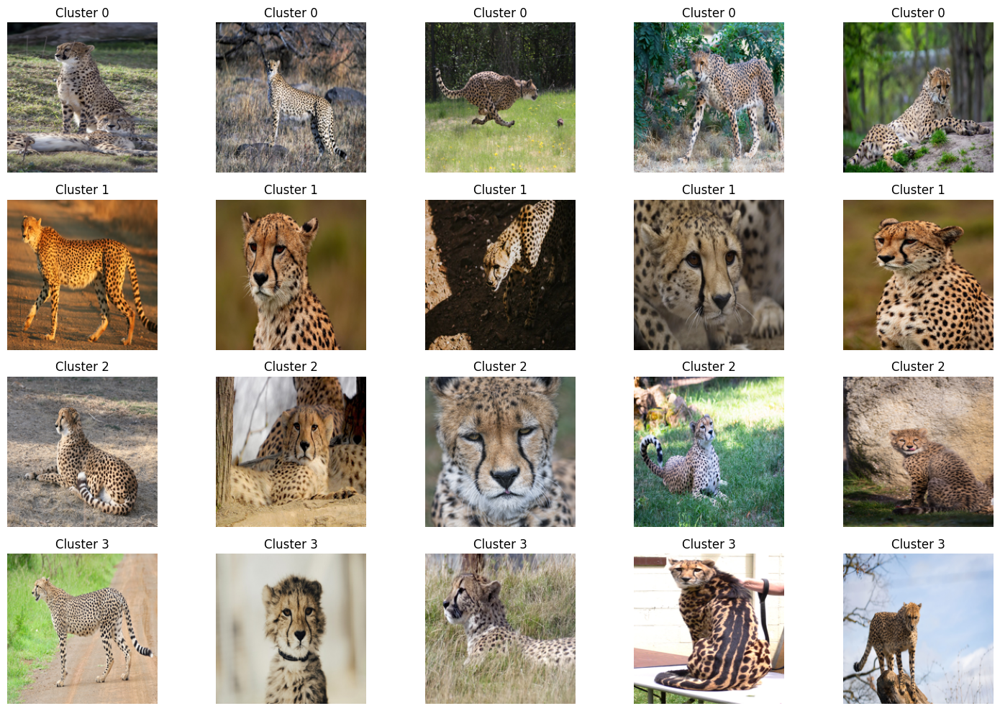

In [23]:
# Flatten each image to a 1D array
from sklearn.cluster import KMeans

flat_images = [img.flatten() for img in images]

# Menggunakan KMeans untuk clustering
n_clusters = 4 # Jumlah cluster, sesuaikan dengan kebutuhan
kmeans = KMeans(n_clusters=n_clusters, random_state=100)
clusters = kmeans.fit_predict(flat_images)

# Menampilkan hasil clustering
print(f"Cluster labels: {clusters}")

# Visualisasi beberapa gambar dari setiap cluster
fig, ax = plt.subplots(n_clusters, 5, figsize=(15, 10))
for cluster in range(n_clusters):
    cluster_images = [images[i] for i in range(len(images)) if clusters[i] == cluster]
    for i in range(min(5, len(cluster_images))):  # Menampilkan max 5 gambar per cluster
        ax[cluster, i].imshow(cluster_images[i])
        ax[cluster, i].axis('off')
        ax[cluster, i].set_title(f"Cluster {cluster}")
plt.tight_layout()
plt.show()

In [24]:
# Menghitung Silhouette Score
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, davies_bouldin_score

silhouette_avg = silhouette_score(flat_images, clusters)
print(f"Silhouette Score: {silhouette_avg:.4f}")

# Menghitung Davies-Bouldin Index
davies_bouldin = davies_bouldin_score(flat_images, clusters)
print(f"Davies-Bouldin Index: {davies_bouldin:.4f}")

# Menghitung Inertia (within-cluster sum-of-squares)
inertia = kmeans.inertia_
print(f"Inertia (Within-Cluster Sum of Squares): {inertia:.4f}")

Silhouette Score: 0.0765
Davies-Bouldin Index: 2.8371
Inertia (Within-Cluster Sum of Squares): 1137666.4335


In [25]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score, davies_bouldin_score

# Menggunakan Agglomerative Clustering
n_clusters = 5  # Jumlah cluster, sesuaikan dengan kebutuhan
agglo_clustering = AgglomerativeClustering(n_clusters=n_clusters)
agglo_clusters = agglo_clustering.fit_predict(flat_images)

# Evaluasi clustering dengan Agglomerative Clustering
silhouette_avg_agglo = silhouette_score(flat_images, agglo_clusters)
davies_bouldin_agglo = davies_bouldin_score(flat_images, agglo_clusters)

print(f"Agglomerative Clustering Silhouette Score: {silhouette_avg_agglo:.4f}")
print(f"Agglomerative Clustering Davies-Bouldin Index: {davies_bouldin_agglo:.4f}")


Agglomerative Clustering Silhouette Score: 0.0351
Agglomerative Clustering Davies-Bouldin Index: 3.2053


In [26]:
from sklearn.cluster import DBSCAN

# Menggunakan DBSCAN
dbscan = DBSCAN(eps=0.5, min_samples=5)
dbscan_clusters = dbscan.fit_predict(flat_images)

# Evaluasi clustering dengan DBSCAN
# Perhatikan: Silhouette score hanya dapat dihitung jika setidaknya ada 2 cluster yang terbentuk
if len(set(dbscan_clusters)) > 1:
    silhouette_avg_dbscan = silhouette_score(flat_images, dbscan_clusters)
    davies_bouldin_dbscan = davies_bouldin_score(flat_images, dbscan_clusters)
    print(f"DBSCAN Silhouette Score: {silhouette_avg_dbscan:.4f}")
    print(f"DBSCAN Davies-Bouldin Index: {davies_bouldin_dbscan:.4f}")
else:
    print("DBSCAN gagal membentuk lebih dari 1 cluster. Silakan coba dengan parameter eps atau min_samples yang berbeda.")

DBSCAN gagal membentuk lebih dari 1 cluster. Silakan coba dengan parameter eps atau min_samples yang berbeda.
